In [1]:
import scipy
import numpy as np
from sklearn.neighbors import KernelDensity
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import estimate_bandwidth
from sklearn.cluster import MeanShift, estimate_bandwidth

import pandas as pd

from scipy import stats
from scipy.stats import beta
from math import sin
from random import randint

import matplotlib.pyplot as plt
import itertools as it

import plotly
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
init_notebook_mode(connected=True)

import collections

def recursively_default_dict():
        return collections.defaultdict(recursively_default_dict)

from matplotlib.collections import BrokenBarHCollection
import re


PCA_color_ref= ['darkseagreen','crimson', 'darkorange', 'darkblue', 'darkcyan',
            'darkgoldenrod', 'darkgray', 'darkgrey', 'darkgreen',
            'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange',
            'darkorchid', 'darkred', 'darksalmon', 'darkseagreen',
            'darkslateblue', 'darkslategray', 'darkslategrey',
            'darkturquoise', 'darkviolet', 'deeppink']

%matplotlib inline

## .vcf analysis

Jupyter notebook for the local analysis of genetic data stored in `.vcf` format.

Perform analysis of structure across data set, followed by a more detailed study of variation across local genomic windows.

## Input

In [2]:
from structure_tools.vcf_geno_tools import simple_read_vcf

vcf_file= 'data_val_g30d0.40s10.vcf'

genotype, summary, info_save= simple_read_vcf(vcf_file,row_info= 5,header_info= 9,phased= False)

print('Number of markers: {}'.format(genotype.shape[1]))
print('Number of individuals: {}'.format(genotype.shape[0]))



Number of markers: 18881
Number of individuals: 110


In [3]:
from structure_tools.Tutorial_subplots import plot_global_pca

## Perform PCA
n_comp= 3

pca = PCA(n_components=n_comp, whiten=False,svd_solver='randomized')

feats= pca.fit_transform(genotype)
## perform MeanShift clustering.
bandwidth = estimate_bandwidth(feats, quantile=0.2)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=False, cluster_all=True, min_bin_freq=25)
ms.fit(feats)
labels1 = ms.labels_
label_select = {y:[x for x in range(len(labels1)) if labels1[x] == y] for y in sorted(list(set(labels1)))}

###
plot_global_pca(feats,label_select,PCA_color_ref,title= 'global_pca',height= 500,width= 950)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



### Local Analysis

Analyse genetic variation across genomic windows. Begin by chosing the size of each window (`window_size`) and the distance between windows (in number of markers, `Steps`).

In [4]:
from structure_tools.vcf_geno_tools import geno_window_split
##### 
window_size= 150
Steps= 20

Windows, Out= geno_window_split(genotype,
                                summary,
                                Steps= Steps,
                                window_size=window_size)

print('number of chromosomes: {}'.format(len(Windows)))
print('number of windows: {}'.format(sum([len(Windows[x].keys()) for x in Windows.keys()])))


number of chromosomes: 1
number of windows: 938


## II. Variation across windows.

>*i. Chose a range of windows, or a number of windows to be sampled randomly.*

>*ii. Perform PCA, AMOVA and allele frequency extraction at each window*

Analyses can be performed in either a supervised or an unsupervised manner.
For supervised analyses, use the labels from the Meanshift analysis above to chose reference labels. If the argument `include_who` is provided (list), analyses will be perform using only samples from the groups identified in that list.

>*i. Analyse AMOVA density and distribution across windows.*

>*ii. Analyse genetic distance between reference or unsupervised groups at selected windows.*

>*iii. Analyze principal component analysis projection along 1st PC across windows selected.*


### **i.** Window analysis

In [5]:
from structure_tools.vcf_geno_tools import window_analysis

dict_coords= {}
Windows_range_pca= [100,350]
ref_labels= [2,3,4]

group_list= [2,2]
PC_selection= [1,2]

for access in range(len(group_list)):
    include_who= [group_list[access]]
    

    Frequencies, sim_fst, Results, Construct, pc_density_s, pc_coords_s, fst_fig= window_analysis(Windows,
                                                                                     ref_labels,
                                                                                     labels1,
                                                                                     Chr= 1,
                                                                                     ncomp= 4,
                                                                                     amova= False,
                                                                                     supervised= True,
                                                                                     include_who= include_who,
                                                                                     range_sample= Windows_range_pca,
                                                                                     rand_sample= 0,
                                                                                     clsize= 15,
                                                                                     cl_freqs= 5,
                                                                                     Bandwidth_split= 20,
                                                                                     quantile= .2,
                                                                                     centre_d= True,
                                                                                     PC_sel= PC_selection[access] - 1)
    
    labels_code_s= labels1

    if include_who:
        labels_code_s= [x for x in labels_code_s if x in include_who]
    
    dict_coords[access]= {
        'coords': pc_coords_s,
        'dens': pc_density_s,
        'labs': labels_code_s
    }



### Sound from amp

We will use the standard deviation of a single population across a given component as the amplitude of a audio signal.

First select the group, PC and range of local windows to use. We run the `window_analysis` function to extract centred PCA coordinates.



In [6]:
from music_tools.my_music_tools import get_sound_coords

qtl= 0.95

group= 2
PC_select= 1

sampleRate = 44100
frequency = 1600
length = 10


fig_test= get_sound_coords(dict_coords[0]['coords'],sampleRate= sampleRate,
                                frequency= frequency,
                                length= length,
                                group= group,
                                PC_select= PC_select)


fig_test['layout'].update(height= 400,width= 900)
iplot(fig_test)

In [7]:
import music_tools.thinkdsp as thinkdsp
import music_tools.thinkplot as thinkplot

qtl= 0.95

group= 2
PC_select= 1

sampleRate = 44100
frequency = 8700
length = 10

inters= []
for windl in dict_coords[0]['coords']:

    ci = scipy.stats.norm.interval(qtl, loc=np.mean(windl), scale=np.std(windl))
    inters.append(ci)

inters= np.array(inters)

from scipy.interpolate import interp1d
q= inters[:,1] - inters[:,0]

max_q= max(q)
q= q / max_q

###
###
###

t = np.linspace(0, length, inters.shape[0])
f2= interp1d(t, q, kind='cubic')

xfloor = np.linspace(0, length, sampleRate * length)
roof= f2(xfloor)
y = np.sin(np.sin(xfloor * frequency) * roof) 
y= y * max_q / 2
y= np.array(y)

#y= roof * max_q

wave= thinkdsp.Wave(y,framerate=sampleRate)

wave.make_audio()


In [8]:
len(inters)

250

In [9]:
sampleRate = 44100
length = 10

frequencies= [1700,1200]

var_tracks= {}
range_s= np.random.choice(list(range(len(frequencies))),4)

for access in range_s:
    
    frequency= frequencies[access]
    
    inters= []
    for windl in dict_coords[access]['coords']:

        ci = scipy.stats.norm.interval(qtl, loc=np.mean(windl), scale=np.std(windl))
        inters.append(ci)

    inters= np.array(inters)

    from scipy.interpolate import interp1d
    q= inters[:,1] - inters[:,0]

    max_q= max(q)
    q= q / max_q

    ###
    ###
    ###

    t = np.linspace(0, length, inters.shape[0])
    f2= interp1d(t, q, kind='quadratic')

    xfloor = np.linspace(0, length, sampleRate * length)
    roof= f2(xfloor)
    y = np.sin(np.sin(xfloor * frequency) * roof) 
    y= y * max_q / 2
    y= np.array(y)
    
    #y= roof
    
    var_tracks[access]= y


y_compound= np.array(list(var_tracks.values()))
wave_c= thinkdsp.Wave(y_compound,framerate=sampleRate)

wave_c.make_audio()

In [58]:
int(len(y_keep) / len(y))

0

In [43]:
## mix
n_blocks= 10
mix_dots= sorted(np.random.choice(list(range(y.shape[0])),n_blocks))

mix_dots.append(y.shape[0])

track_choice= np.random.choice(list(var_tracks.keys()),n_blocks + 1,replace= True)

track_vec= []
for frame in range(y.shape[0]):
    if frame > mix_dots[0]:
        mix_dots= mix_dots[1:]
        track_choice= track_choice[1:]
    
    track_vec.append(var_tracks[track_choice[0]][frame])

track_vec= np.array(track_vec)

wave_mix= thinkdsp.Wave(track_vec,framerate=sampleRate)

wave_mix.make_audio()

In [44]:
#y_add= wave_mix.__add__(wave)
y_add= np.sum(y_compound,axis= 0)
y_add= thinkdsp.Wave(y_add,framerate=sampleRate)
y_add.make_audio()

In [45]:
wave_multiple= thinkdsp.Wave(track_vec,y_compound[1],framerate= sampleRate)
wave_multiple.make_audio()

In [ ]:
#import music_tools.thinkplot_I as thinkplot
#import music_tools.thinkdsp_I as thinkdsp_I

spectrum = wave_c.make_spectrum()
spectrum.plot()
thinkplot.config(xlabel='frequency (Hz)',legend=False)

In [ ]:
spectrogram = wave_c.make_spectrogram(seg_length=1024)
spectrogram.plot(high=1000)

In [626]:
import music_tools.thinkdsp as thinkdsp
import music_tools.thinkplot as thinkplot

from __future__ import print_function
import librosa

# 1. Get the file path to the included audio example
filename = '92002__jcveliz__violin-origional.wav'
filename = '100475__iluppai__saxophone-weep.wav'
#filename = '105977__wcfl10__favorite-station.wav'
#filename = 'Hans_Zimmer_Time.wav'

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y_wav, sr = librosa.load(filename)

wave_violin= thinkdsp.Wave(y_wav,framerate=sr)

# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y_wav, sr=sr)

print('Estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

print('Saving output to beat_times.csv')
librosa.output.times_csv('beat_times.csv', beat_times)

Estimated tempo: 103.36 beats per minute
Saving output to beat_times.csv


In [627]:
keep= 10
plus= 165
#y_keep= y_wav[(plus*sr):(plus*sr+keep * sr)]
y_keep= y_wav

In [628]:
wave_vio= thinkdsp.Wave(y_keep,framerate=sr)

wave_vio.make_audio()

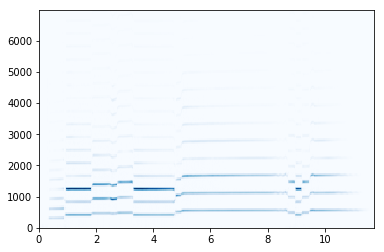

In [629]:
seg_length= 512
height= 7000
spectrogram = wave_vio.make_spectrogram(seg_length= seg_length)
spectrogram.plot(high=height)

In [630]:

def find_index(x, xs):
    """Find the index corresponding to a given value in an array."""
    n = len(xs)
    start = xs[0]
    end = xs[-1]
    i = round((n-1) * (x - start) / (end - start))
    return int(i)

def return_spec_array(spect,high= 5000):
        """
        high: highest frequency component to plot
        """
        fs = spect.frequencies()
        i = None if high is None else find_index(high, fs)
        fs = fs[:i]
        ts = spect.times()

        # make the array
        size = len(fs), len(ts)
        array = np.zeros(size, dtype=np.float)

        # copy amplitude from each spectrum into a column of the array
        for j, t in enumerate(ts):
            spectrum = spect.spec_map[t]
            array[:, j] = spectrum.amps[:i]

        return array, ts, fs

    


In [631]:
method_list= ['tdsp','librosa']
method_pick= 0

method= method_list[method_pick]

In [632]:
### using librosa

if method == 'librosa':
    
    step = int(seg_length // 2)
    n_mels= 128

    array_spec = librosa.feature.melspectrogram(y=y, hop_length=step,
                                                    fmax=height, n_fft= seg_length, sr= sr, n_mels= n_mels)

    spec_fs= np.linspace(0,height,n_mels,seg_length)
    spec_ts= np.arange(0,len(y),step)
    spec_ts= (spec_ts / len(y)) * (len(y) /sr)

if method == 'tdsp':
    
    array_spec, spec_ts, spec_fs= return_spec_array(spectrogram,high= height)
    array_spec.shape


In [633]:
array_spec.shape

(163, 1010)

In [634]:
frame_plot= 206

probs= array_spec[:,frame_plot]
probs[probs < 0] = 0

#probs= (probs) / np.std(probs)
#probs= np.sqrt(probs)

fig= [go.Scatter(
    x= probs,
    y= spec_fs,
    mode= 'lines'
)]

iplot(fig)

In [677]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.datasets.samples_generator import make_blobs

#### get maximums, use amp as likelihood

frame= 206
Sample_N= 1000

p_threshold= 0.0000

probs= array_spec[:,frame]

#probs[probs < 0.4] = 0
probs[probs > 3]= 3

#probs= (probs) / np.std(probs)
#probs= np.sqrt(probs)

#probs= np.exp(probs) 
probs= probs / np.sum(probs)

new_freqs= np.random.choice(list(spec_fs),Sample_N,replace= True,p= probs)

#new_freqs= scale(new_freqs)
new_freqs= new_freqs.reshape(-1,1)


bandwidth = estimate_bandwidth(new_freqs, quantile=0.02, n_samples=1000)


X_plot = np.linspace(0, max(new_freqs) + 100, 1000)[:, np.newaxis]
kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(new_freqs)
log_dens = kde.score_samples(X_plot)

fig= [go.Scatter(x=X_plot[:,0], y=np.exp(log_dens), 
                            mode='lines', fill='tozeroy',
                            line=dict(color='#AAAAFF', width=2))]

# #############################################################################
# Compute clustering with MeanShift

# The following bandwidth can be automatically detected using

ms = MeanShift(bandwidth=bandwidth, bin_seeding=False,cluster_all= False).fit(new_freqs)

labels = ms.labels_
cluster_centers = ms.cluster_centers_
cluster_centers= list(it.chain(*cluster_centers))
#len(cluster_centers)

## trim_clusters:
trim_cl= {}

for cml in cluster_centers:
    if not trim_cl:
        trim_cl[0]= np.array([cml])
        continue

    d= 0

    for clamp in trim_cl.keys(): 
        dists= abs(trim_cl[clamp] - cml)

        if min(dists) < 200:
            trim_cl[clamp]= np.array([*list(trim_cl[clamp]),cml])
            d += 1

    if d == 0:
        trim_cl[len(trim_cl)]= np.array([cml])

pval_trim= [[np.exp(kde.score_samples(x.reshape(-1,1))) for x in trim_cl[z]] for z in trim_cl.keys()]
trim_cl= [trim_cl[x][np.argmax(pval_trim[x])] for x in trim_cl.keys()]
#trim_cl= [np.mean(x) for x in trim_cl.values()]

cluster_centers= trim_cl

shapes= []

for center in cluster_centers:
    
    if np.exp(kde.score_samples(center.reshape(-1,1))) >= p_threshold:
        closest= abs(spec_fs - center)
        
        closet= np.argmin(closest)
        
        amp_sel= array_spec[closet,frame]
        
        if amp_sel >= 0.3:
            shapes.append({
                'type': 'line',
                'x0': center,
                'y0': 0,
                'x1': center,
                'y1': max(np.exp(log_dens)),
                'line': {
                    'color': 'red',
                    'width': 4,
                    'dash': 'solid'
                },
            })

layout= go.Layout(
    title= 'here',
    shapes= shapes
)

figure_frame= go.Figure(data= fig,layout= layout)
iplot(figure_frame)


In [672]:
amp_sel

0.414028233287215

In [637]:
frame_many= array_spec.shape[1]
frame_crawl= np.linspace(0,array_spec.shape[1] - 1,frame_many)

ts_list= []
peaks= []
amps= []
Sample_N= 1000

prob_attack= []

for frame in frame_crawl:
    frame= int(frame)

    p_threshold= 0.0002

    probs= array_spec[:,frame] 
    
    
    probs[probs < 0]= 0
    probs[probs > 3]= 3

    #probs= (probs - np.mean(probs)) / np.std(probs)

    #probs= np.sqrt(probs) 
    prob_sum= np.sum(probs)
    probs= probs / prob_sum

    new_freqs= np.random.choice(list(spec_fs),Sample_N,replace= True,p= probs)
    prob_attack.append(new_freqs)
    
    new_freqs= new_freqs.reshape(-1,1)

    bandwidth = estimate_bandwidth(new_freqs, quantile=0.02, n_samples=1000)
    if bandwidth== 0:
        bandwidth= 100


    X_plot = np.linspace(0, max(spec_fs) + 100, 1000)[:, np.newaxis]
    kde = KernelDensity(kernel='gaussian', bandwidth=100).fit(new_freqs)
    log_dens = kde.score_samples(X_plot)

    fig= [go.Scatter(x=X_plot[:, 0], y=np.exp(log_dens), 
                                mode='lines', fill='tozeroy',
                                line=dict(color='#AAAAFF', width=2))]



    # #############################################################################
    # Compute clustering with MeanShift

    # The following bandwidth can be automatically detected using

    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True,cluster_all= False).fit(new_freqs)

    labels = ms.labels_
    cluster_centers = ms.cluster_centers_
    
    cluster_centers= list(it.chain(*cluster_centers))
    
    ## trim_cls
    trim_cl= {}

    for cml in cluster_centers:
        if not trim_cl:
            trim_cl[0]= np.array([cml])
            continue

        d= 0

        for clamp in trim_cl.keys(): 
            dists= abs(trim_cl[clamp] - cml)

            if min(dists) < 150:
                trim_cl[clamp]= np.array([*list(trim_cl[clamp]),cml])
                d += 1

        if d == 0:
            trim_cl[len(trim_cl)]= np.array([cml])

    pval_trim= [[np.exp(kde.score_samples(x.reshape(-1,1))) for x in trim_cl[z]] for z in trim_cl.keys()]
    trim_cl= [trim_cl[x][np.argmax(pval_trim[x])] for x in trim_cl.keys()]
    
    #trim_cl= [np.mean(x) for x in trim_cl.values()]

    cluster_centers= trim_cl
    
    peak_cent= []
    amps_centres= []
    
    shapes= []
    for cent in cluster_centers:

        if np.exp(kde.score_samples(cent.reshape(-1,1))) >= p_threshold:
            closest= abs(spec_fs - cent)
            #print(closest[:10])
            closet= np.argmin(closest)
            #amp_sel= array_spec[closet,frame]
            amp_sel= array_spec[closet,frame]
            
            if amp_sel >= 0.5:
                peak_cent.append(cent)
                amps_centres.append(amp_sel)
        
    #print(len(amps_centres))
    #ts_list.extend([spec_ts[frame]]* len(cluster_centers))
    #peaks.extend([x[0] for x in cluster_centers])
    peaks.extend(peak_cent)
    ts_list.extend([spec_ts[frame]]* len(amps_centres))
    amps.extend(amps_centres)


In [638]:
fig= [go.Scatter(
    x= ts_list,
    y= peaks,
    mode= 'markers',
    marker= dict(
        color= amps,
        colorscale= 'Viridis'
    )
)]

iplot(fig)

In [639]:
## from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale

###

samps_tracks= np.array([
    [x for x in ts_list],
    peaks
]).T


#samps_tracks= scale(samps_tracks)

#samps_tracks = StandardScaler().fit_transform(samps_tracks)




# #############################################################################
# Compute DBSCAN
db = DBSCAN(eps=0.2, min_samples=20).fit(samps_tracks)
labels = db.labels_

bandwidth = estimate_bandwidth(samps_tracks, quantile=.05, n_samples=samps_tracks.shape[0])
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True,cluster_all= True).fit(samps_tracks)

labels = ms.labels_
coords= {
    z: [x for x in range(len(labels)) if labels[x] == z] for z in list(set(labels)) if z != -1
}

fig= [go.Scatter(
    x= [ts_list[x] for x in coords[i]],
    y= [peaks[x] for x in coords[i]],
    mode= 'markers',
    name= str(i),
    marker= dict(
        color= i
    )
) for i in coords.keys()]

iplot(fig)

In [640]:
bandwidth

76.470874565632045

In [641]:
## an extra step to clean this up.
bandwidth = estimate_bandwidth(samps_tracks, quantile=0.15, n_samples=samps_tracks.shape[0])
extra_cls= {}


for clust in coords.keys():
    subset= samps_tracks[coords[clust],:]
    subset= scale(subset)
    
    if subset.shape[0] > 10:
        
        #bandwidth = estimate_bandwidth(subset, quantile=0.1, n_samples=subset.shape[0])
        if bandwidth > 0:
            ms = MeanShift(bin_seeding=True,cluster_all= True).fit(subset)

            labels_local = ms.labels_
            coords_local= {
                z: [coords[clust][x] for x in range(len(labels_local)) if labels_local[x] == z] for z in list(set(labels_local)) if z != -1
            }
            coords_local= {z:coords_local[z] for z in coords_local.keys() if len(coords_local[z]) > 3}
            coords_keys= sorted(coords_local.keys())

            if len(coords_keys) > 1:
                coords[clust]= coords_local[coords_keys[0]]
                for cl in coords_keys[1:]:
                    extra_cls[len(extra_cls) + len(coords)]= coords_local[cl]


coords.update(extra_cls)
    

In [642]:
fig= [go.Scatter(
    x= [ts_list[x] for x in coords[i]],
    y= [peaks[x] for x in coords[i]],
    mode= 'markers',
    name= str(i),
    marker= dict(
        color= i
    )
) for i in coords.keys()]

iplot(fig)

In [643]:
fig= [go.Scatter(
    x= [ts_list[x] for x in coords[i]],
    y= [np.mean([peaks[x] for x in coords[i]])] * len(coords[i]),
    mode= 'markers',
    name= str(i),
    marker= dict(
        color= i
    )
) for i in coords.keys() if (max(coords[i]) - min(coords[i])) / len(coords[i]) < 100]

iplot(fig)

In [645]:
###

from structure_tools.vcf_geno_tools import window_analysis

dict_coords= {}
Windows_range_pca= [0,350]
ref_labels= [2,3,4]

group_list= [2,3,4,2]
PC_selection= [1,1,1,2]

for access in range(len(group_list)):
    include_who= [group_list[access]]
    

    Frequencies, sim_fst, Results, Construct, pc_density_s, pc_coords_s, fst_fig= window_analysis(Windows,
                                                                                     ref_labels,
                                                                                     labels1,
                                                                                     Chr= 1,
                                                                                     ncomp= 4,
                                                                                     amova= False,
                                                                                     supervised= True,
                                                                                     include_who= include_who,
                                                                                     range_sample= Windows_range_pca,
                                                                                     rand_sample= 0,
                                                                                     clsize= 15,
                                                                                     cl_freqs= 5,
                                                                                     Bandwidth_split= 20,
                                                                                     quantile= .2,
                                                                                     centre_d= True,
                                                                                     PC_sel= PC_selection[access] - 1)
    
    
    labels_code_s= labels1

    if include_who:
        labels_code_s= [x for x in labels_code_s if x in include_who]
    
    dict_coords[access]= {
        'coords': pc_coords_s,
        'dens': pc_density_s,
        'labs': labels_code_s
    }



In [646]:
sampleRate = sr
length = y_keep.shape[0] / sr
xfloor = np.linspace(0, length, sampleRate * length)

qtl= .95

amp_stock= []
max_q_list= []

for access in dict_coords.keys():
        
    inters= []
    for windl in dict_coords[access]['coords']:

        ci = scipy.stats.norm.interval(qtl, loc=np.mean(windl), scale=np.std(windl))
        inters.append(ci)

    inters= np.array(inters)

    from scipy.interpolate import interp1d
    q= inters[:,1] - inters[:,0]

    max_q= max(q)
    q= q / max_q

    ###
    ###
    ###

    t = np.linspace(0, length, inters.shape[0])
    f2= interp1d(t, q, kind='cubic')

    roof= f2(xfloor)
    #roof= roof * max_q / 2
    
    max_q_list.append(max_q)
    amp_stock.append(roof)


amp_stock= np.array(amp_stock)


c:\users\jgarcia\appdata\local\programs\python\python36-32\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning:

object of type <class 'float'> cannot be safely interpreted as an integer.



In [647]:
x_space= [(max(coords[cl]) - min(coords[cl])) / len(coords[cl]) for cl in coords.keys()]
x_space= np.array(x_space).reshape(-1,1)

X_plot = np.linspace(0, 1000, 1000)[:, np.newaxis]
kde = KernelDensity(kernel='gaussian', bandwidth=10).fit(x_space)
log_dens = kde.score_samples(X_plot)

fig= [go.Scatter(x=X_plot[:,0], y=np.exp(log_dens), 
                            mode='lines', fill='tozeroy',
                            line=dict(color='#AAAAFF', width=2))]

iplot(fig)

In [666]:
from scipy.spatial import distance

# seg_length
t_total= np.linspace(0,length,sr * int(length))
step = int(seg_length // 2)
seg_time= seg_length / sr
N_compares= 40
#xfloor = np.linspace(0, length, sampleRate * length)

y_composition= np.zeros(sr * int(length))

for cl in coords.keys():
    
    if max(coords[cl]) - min(coords[cl]) > len(coords[cl]) * 100:
        continue

    y_base= np.zeros(sr * int(length))
    
    frequency= np.mean([peaks[x] for x in coords[cl]])
    frequencies_is= np.array([peaks[x] for x in coords[cl]])
    frequencies_is= [frequencies_is[0],*frequencies_is,frequencies_is[-1]]
    #print(frequency)
    
    
    amps_cl= np.array([amps[x] for x in coords[cl]])
    amp_here= np.mean(amps_cl)
    
    times_cl= np.array(sorted([ts_list[x] for x in coords[cl]]))
    
    times_cl= [min(times_cl) - seg_time / 2,*times_cl,max(times_cl) + seg_time / 2]
    amps_cl= [min(amps_cl),*amps_cl,max(amps_cl)]
    
    if len(amps_cl) < 2:
        continue
    ### duplicates
    while len(list(set(times_cl))) < len(times_cl):
        z_new= []
        for tpo in times_cl:
            if tpo in z_new:
                z_new.append(tpo + seg_time / 2)
                continue
            z_new.append(tpo)
        
        times_cl= z_new
    
    times_cl= sorted(times_cl)
    ### interpolate prepare time
    
    #t_zone= [min(times_cl) - seg_time / 2,max(times_cl) + seg_time / 2]
    t_zone= [min(times_cl),max(times_cl)]
    
    time_frame= t_zone[1] - t_zone[0]
    
    times_cl[np.argmin(times_cl)]= times_cl[np.argmin(times_cl)] #- seg_time / 2
    times_cl[np.argmax(times_cl)]= times_cl[np.argmax(times_cl)] #+ seg_time / 2
    
    t1 = np.linspace(t_zone[0], t_zone[1], time_frame * sr)
    #t2= np.linspace(0,time_frame, time_frame * sr)
    
    ### interpolate - amp
    f2= interp1d(times_cl,amps_cl, kind='quadratic')

    #print(len(t1))
    amp_synth_cl= f2(t1)
    
    ### interpolate - freq
    f3= interp1d(times_cl,frequencies_is, kind='quadratic')
    #print(len(t1))
    freq_synth_cl= f3(t1)
    
    ###    
    cl_size= len(amps_cl)
    cl_sample_size= cl_size * seg_length #

    amp_synth_cl= scale(amp_synth_cl) 

    where_to= np.random.choice(list(range(amp_stock.shape[1] - len(t1))), N_compares)

    Base= []
    intel= []

    for rep in where_to:
        
        # 
        Block= amp_stock[:,rep:rep + len(t1)]
        #print(Block.shape)
        #Block= np.mean(Block,axis= 1)
        
        #Blocks= np.array(Blocks).T

        Block= scale(Block,axis= 1)
        
        
        inteligence= [[rep,x] for x in range(amp_stock.shape[0])]
        intel.extend(inteligence)
        Base.extend(Block)

    Base= np.array(Base)

    dists= distance.cdist(amp_synth_cl.reshape(1,-1), Base, 'euclidean')

    who= np.argmin(dists)
    who= intel[who]
    
    rep= who[0]
    
    Block= amp_stock[who[1],rep:rep + len(t1)]
    
    y_sin = np.sin(t1 * frequency * np.pi) * (Block * max_q_list[who[1]] / 2)
    #y_sin= y_sin * amp_here 
    #y_sin= y_sin * max_q_list[who[1]] / 2
    y_sin= np.array(y_sin)
    
    timepoint= abs(t_total - t_zone[0])
    timepoint= np.argmin(timepoint)
    
    if timepoint + len(t1) > y_base.shape[0]:
        y_sin= y_sin[:(y_base.shape[0] - timepoint)]
    
    y_base[timepoint:(timepoint + len(t1))] = y_sin
    
    #y_composition.append(y_base)
    y_composition += y_base



c:\users\jgarcia\appdata\local\programs\python\python36-32\lib\site-packages\ipykernel_launcher.py:57: DeprecationWarning:

object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.

c:\users\jgarcia\appdata\local\programs\python\python36-32\lib\site-packages\sklearn\preprocessing\data.py:181: UserWarning:

Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 



In [667]:
add_noise= noise = np.random.normal(0,0.005,len(y_composition))
y_composition += add_noise

In [668]:
len(Base[0])

2304

In [669]:
wave_mix= thinkdsp.Wave(y_composition,framerate=sr)

wave_mix.make_audio()

In [664]:
from scipy.io import wavfile


wavfile.write('mix_dirty_I.wav', sr, y_composition)

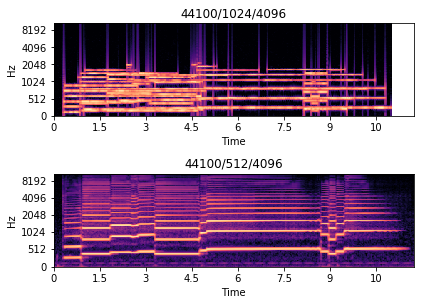

In [665]:
import librosa.display as _display
#from presets import Preset


#librosa = Preset(_librosa)

M = librosa.feature.melspectrogram(y=np.array(y_composition))

# Of course, you can still override the new default manually, e.g.:

M_highres = librosa.feature.melspectrogram(y=y_wav, hop_length=512)


# And plot the results
plt.figure(figsize=(6, 6))
ax = plt.subplot(3, 1, 1)

librosa.display.specshow(librosa.power_to_db(M, ref=np.max),
                         y_axis='mel', x_axis='time')

plt.title('44100/1024/4096')

plt.subplot(3, 1, 2, sharex=ax, sharey=ax)
librosa.display.specshow(librosa.power_to_db(M_highres, ref=np.max),
                         hop_length=512,
                         y_axis='mel', x_axis='time')
plt.title('44100/512/4096')

# We can repeat the whole process with different defaults, just by
# updating the parameter entries
#librosa['sr'] = 11025


plt.tight_layout()
plt.show()


In [600]:
#y= np.sum(y_compound,axis= 0)

MemoryError: 

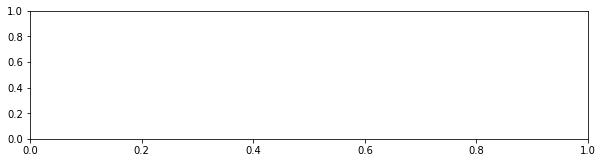

In [601]:
S = np.abs(librosa.stft(y))
comps, acts = librosa.decompose.decompose(S, n_components=16,
                                               sort=True)

#import sklearn.decomposition
#T = sklearn.decomposition.MiniBatchDictionaryLearning(n_components=16)
#comps, acts = librosa.decompose.decompose(S, transformer=T, sort=True)

plt.figure(figsize=(10,8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S,
                                                 ref=np.max),
                         y_axis='log', x_axis='time')
plt.title('Input spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.subplot(3, 2, 3)
librosa.display.specshow(librosa.amplitude_to_db(comps,
                                                 ref=np.max),
                         y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Components')
plt.subplot(3, 2, 4)
librosa.display.specshow(acts, x_axis='time')
plt.ylabel('Components')
plt.title('Activations')
plt.colorbar()
plt.subplot(3, 1, 3)
S_approx = comps.dot(acts)
librosa.display.specshow(librosa.amplitude_to_db(S_approx,
                                                 ref=np.max),
                         y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Reconstructed spectrogram')
plt.tight_layout()

NameError: name 'sr' is not defined

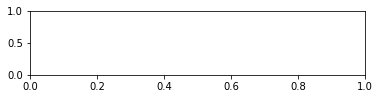

In [16]:
#y, sr = librosa.load(librosa.util.example_audio_file(), duration=10)
plt.figure()
plt.subplot(3, 1, 1)
librosa.display.waveplot(y, sr=sr)
plt.title('Monophonic')



y_harm, y_perc = librosa.effects.hpss(y)
plt.subplot(3, 1, 3)
librosa.display.waveplot(y_harm, sr=sr, alpha=0.25)
librosa.display.waveplot(y_perc, sr=sr, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')
plt.tight_layout()